<a href="https://colab.research.google.com/github/SayanDuttaPersonalGithub/3rd-try/blob/main/myFirstDL.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
! [ -e /content ] && pip install -Uqq fastbook
import fastbook
fastbook.setup_book()
from fastbook import *
from fastai.vision.widgets import *

Mounted at /content/gdrive


In [3]:
from fastbook import search_images_ddg

In [4]:
result=search_images_ddg('Indian Pariah Dog',max_images=150)
len(result)

150

In [5]:
dist='/images/Indian_Pariah_Dog'
download_url(result[0],dist)

Path('/images/Indian_Pariah_Dog')

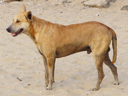

In [6]:
img=Image.open(dist)
img.to_thumb(128,128)

In [7]:
dog_types=["Labrador Retriever",
    "German Shepherd",
    "Golden Retriever",
    "Beagle",
    "Pug",
    "Indian Pariah",
    "Indian Spitz",
    "Boxer",
    "Dachshund",
    "Great Dane"]
path=Path('dog')

In [8]:
print(path)

dog


In [9]:
if not path.exists():
  path.mkdir()
for elm in dog_types:
  dest=path/elm
  dest.mkdir(exist_ok=True)
  result=search_images_ddg(f'{elm} Dog',max_images=50)
  download_images(dest,urls=result)

In [10]:
fns=get_image_files(path)
fns

(#475) [Path('dog/Dachshund/758b6181-67c7-4645-9ac0-d61feaebca3e.jpg'),Path('dog/Dachshund/a3ec6901-4fe3-4df9-8e3e-40f5c67b9759.jpg'),Path('dog/Dachshund/811ea356-96f5-481e-b522-12a6d8be833b.jpg'),Path('dog/Dachshund/ac0bfb17-b036-4c1d-90f4-26f22e9d66c7.jpg'),Path('dog/Dachshund/ab2ae88f-5077-4d6d-b8f3-72acd821a15b.jpg'),Path('dog/Dachshund/c07b5a5b-efbd-4e5f-8f91-f8f4066cdcc9.jpg'),Path('dog/Dachshund/55f648dc-159a-4b8e-b762-f79e56231697.png'),Path('dog/Dachshund/1c7fe516-67be-477d-8a0b-2563f53a796c.jpg'),Path('dog/Dachshund/ded1d091-e305-47e1-a941-373cbabe0a4a.jpg'),Path('dog/Dachshund/9f7ca4be-4abd-4e0f-ba41-0cbdff91964e.jpg')...]

In [11]:
failed=verify_images(fns)

In [12]:
failed.map(Path.unlink)

(#11) [None,None,None,None,None,None,None,None,None,None...]

In [13]:
dogs = DataBlock(
    blocks=(ImageBlock,CategoryBlock),
    get_items=get_image_files,
    splitter=RandomSplitter(valid_pct=0.2,seed=42),
    get_y=parent_label,
    item_tfms=Resize(128)
)

In [14]:
dls=dogs.dataloaders(path)

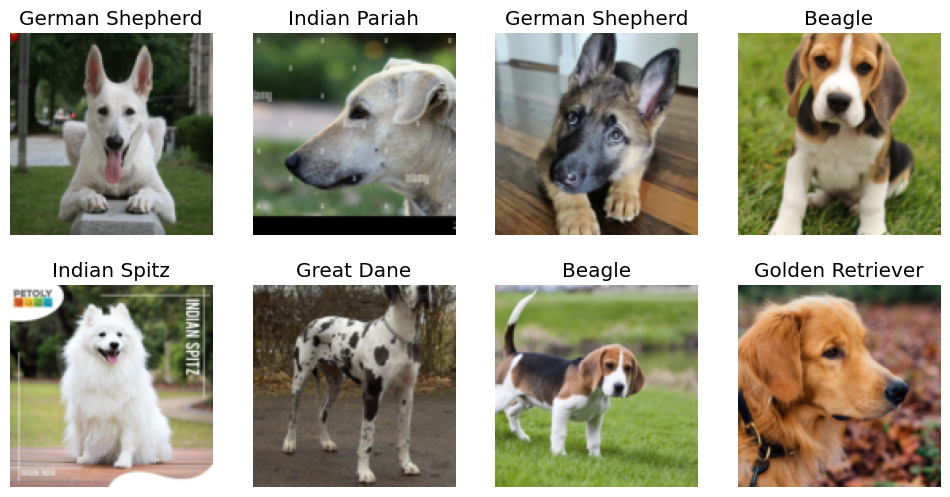

In [15]:
dls.valid.show_batch(max_n=8,nrows=2)

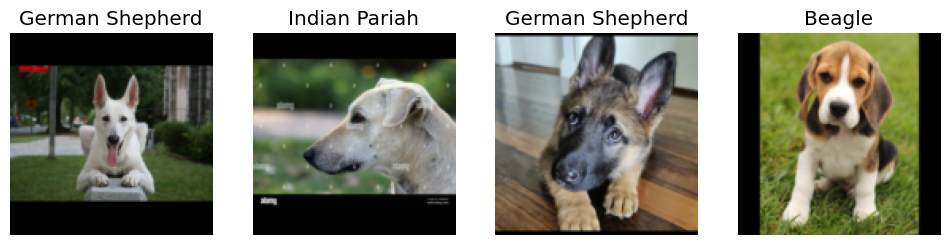

In [16]:
dogs = dogs.new(item_tfms=Resize(128, ResizeMethod.Pad, pad_mode='zeros'))
dls = dogs.dataloaders(path)
dls.valid.show_batch(max_n=4, nrows=1)

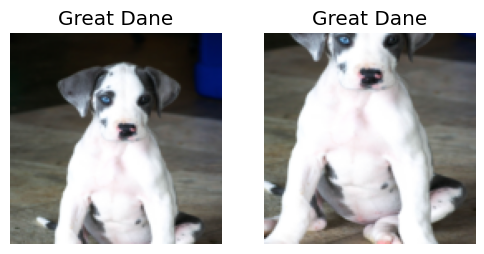

In [17]:
dogs=dogs.new(item_tfms=RandomResizedCrop(128,min_scale=0.3))
dls=dogs.dataloaders(path)
dls.train.show_batch(max_n=2,nrows=1,unique=True)

In [18]:
dogs=dogs.new(item_tfms=RandomResizedCrop(224,min_scale=0.3),
              batch_tfms=aug_transforms())
dls=dogs.dataloaders(path)

In [19]:
learn=vision_learner(dls,resnet18,metrics=error_rate)
learn.fine_tune(2)

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 126MB/s]


epoch,train_loss,valid_loss,error_rate,time
0,3.194501,0.964121,0.347826,01:44


epoch,train_loss,valid_loss,error_rate,time
0,1.207023,0.374553,0.108696,02:20
1,0.962323,0.272533,0.086957,02:14


In [20]:
intrep=ClassificationInterpretation.from_learner(learn)

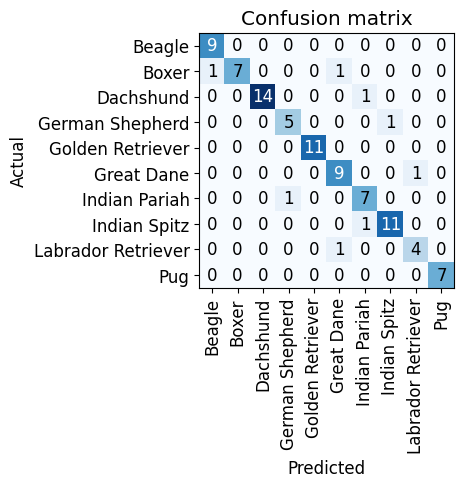

In [21]:
intrep.plot_confusion_matrix()

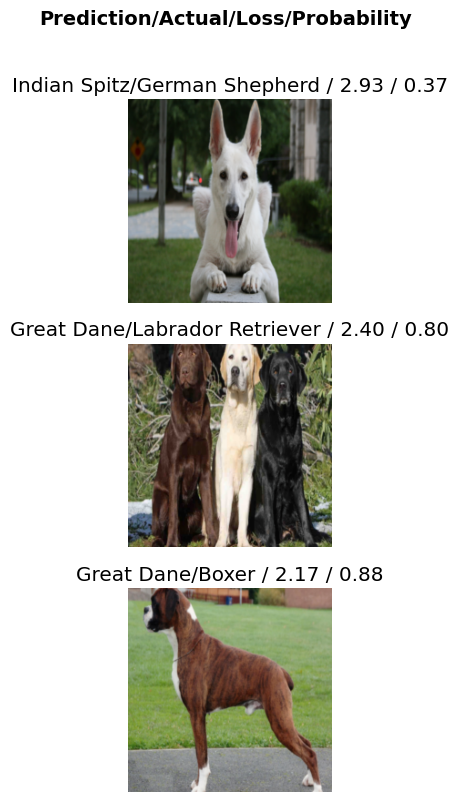

In [24]:
intrep.plot_top_losses(3,nrows=3)

In [25]:
cleaner=ImageClassifierCleaner(learn)

In [26]:
cleaner

In [27]:
learn.export()

In [33]:
path=Path()
print(path)
path.ls(file_exts='.pkl')

.


(#1) [Path('export.pkl')]

In [34]:
learn_inf=load_learner(path/'export.pkl')